# Generate Geo Heat Maps

In [21]:
import streamlit as st
import plotly.express as px
import pandas as pd
import geopandas as gpd
import snowflake.connector
import shapely
import re
import random
from shapely.wkt import loads
from shapely.geometry import mapping
from utils import *

### not some file names have changes (to include 'uk_') and some columnn names capitalised

## Load Data

### Regional Data

In [ ]:
uk_postcode_areas = gpd.read_file("location_data/uk_postcode_areas.csv")
#uk_postcode_areas.rename(columns={"Postcode Area": "POSTCODE_AREA", "Postcode Area Name": "POSTCODE_AREA_NAME", "Region": "REGION"}, inplace=True)
# Load UK postcode to lat/long mapping
uk_postcodes = pd.read_csv("location_data/uk_postcodes.csv")
uk_region_shapes = gpd.read_file("location_data/uk_county_shapes.csv") 
uk_region_shapes2 = gpd.read_file("location_data/uk_district_shapes.csv").iloc[:, ::-1]

display(uk_postcode_areas.head())
display(uk_postcodes.head())
display(uk_region_shapes.head())
display(uk_region_shapes2.head())

,POSTCODE_AREA,POSTCODE_AREA_NAME,REGION
0,AB,Aberdeen,Scotland
1,AL,St. Albans,East of England
2,B,Birmingham,West Midlands
3,BA,Bath,South West
4,BB,Blackburn,North West


,POSTCODE,POSTCODE_STRIP,LATITUDE,LONGITUDE,GEOMETRY
0,AB10 1XG,AB101XG,57.144156,-2.114864,POINT (-2.114864 57.144156)
1,AB10 6RN,AB106RN,57.137871,-2.121487,POINT (-2.121487 57.137871)
2,AB10 7JB,AB107JB,57.124274,-2.127206,POINT (-2.127206 57.124274)
3,AB11 5QN,AB115QN,57.142701,-2.093295,POINT (-2.093295 57.142701)
4,AB11 6UL,AB116UL,57.137468,-2.112455,POINT (-2.112455 57.137468)


,REGION_NAME,GEOMETRY,GEOMETRY_JSON
0,Aberdeen City,POLYGON ((-2.061375677163853 57.21194785019809...,"{'type': 'Polygon', 'coordinates': (((-2.06137..."
1,Aberdeenshire,POLYGON ((-2.061375677163853 57.21194785019809...,"{'type': 'Polygon', 'coordinates': (((-2.06137..."
2,Angus,POLYGON ((-2.444938133537801 56.75170911892659...,"{'type': 'Polygon', 'coordinates': (((-2.44493..."
3,Antrim and Newtownabbey,"POLYGON ((-5.869290733837 54.68893249722253, -...","{'type': 'Polygon', 'coordinates': (((-5.86929..."
4,Ards and North Down,MULTIPOLYGON (((-5.534856755313333 54.68175500...,"{'type': 'MultiPolygon', 'coordinates': [(((-5..."


,GEOMETRY,REGION_NAME
0,MULTIPOLYGON (((-0.383883278247212 52.42135577...,PE8
1,MULTIPOLYGON (((-2.171477208066249 53.85693578...,BB9
2,POLYGON ((-2.88502472979168 53.198006068639785...,CH99
3,MULTIPOLYGON (((1.304671197755517 51.132047268...,CT15
4,MULTIPOLYGON (((-0.718320408406139 52.00563213...,MK5


In [18]:
def extract_postcode_area(postcode):
    # Match the first 1 or 2 letters
    match = re.match(r'^([A-Z]{1,2})', postcode)
    if match:
        return match.group(0)
    return None

# Apply the function to extract postcode area from postcode
uk_postcodes['POSTCODE_AREA'] = uk_postcodes['POSTCODE'].apply(extract_postcode_area)
uk_postcodes.head()


,POSTCODE,POSTCODE_STRIP,LATITUDE,LONGITUDE,GEOMETRY,POSTCODE_AREA
0,AB10 1XG,AB101XG,57.144156,-2.114864,POINT (-2.114864 57.144156),AB
1,AB10 6RN,AB106RN,57.137871,-2.121487,POINT (-2.121487 57.137871),AB
2,AB10 7JB,AB107JB,57.124274,-2.127206,POINT (-2.127206 57.124274),AB
3,AB11 5QN,AB115QN,57.142701,-2.093295,POINT (-2.093295 57.142701),AB
4,AB11 6UL,AB116UL,57.137468,-2.112455,POINT (-2.112455 57.137468),AB


In [ ]:
# Perform the join based on postcode area to get Postcode Area Name and Region
uk_postcode_with_areas = pd.merge(uk_postcodes, uk_postcode_areas, on='POSTCODE_AREA', how='left')
uk_postcode_with_areas.head()

,POSTCODE,POSTCODE_STRIP,LATITUDE,LONGITUDE,GEOMETRY,POSTCODE_AREA,POSTCODE_AREA_NAME,REGION
0,AB10 1XG,AB101XG,57.144156,-2.114864,POINT (-2.114864 57.144156),AB,Aberdeen,Scotland
1,AB10 6RN,AB106RN,57.137871,-2.121487,POINT (-2.121487 57.137871),AB,Aberdeen,Scotland
2,AB10 7JB,AB107JB,57.124274,-2.127206,POINT (-2.127206 57.124274),AB,Aberdeen,Scotland
3,AB11 5QN,AB115QN,57.142701,-2.093295,POINT (-2.093295 57.142701),AB,Aberdeen,Scotland
4,AB11 6UL,AB116UL,57.137468,-2.112455,POINT (-2.112455 57.137468),AB,Aberdeen,Scotland


### Customer Data

In [8]:
# Load Real Customer Data at this Stage - inc. postcode and desired audience and metrics
random_valid_postcode = lambda: random.choice(uk_postcodes['POSTCODE'])

def generate_dummy_data(n=500000):
    data = {
        "MEMBER_ID": [_ for _ in range(1000, 1000 + n)],
        "POSTCODE": [random_valid_postcode() for _ in range(n)],
        "BALANCE": [round(random.uniform(0, 100000), 2) for _ in range(n)]  # Random balance between 0-100k
    }
    df = pd.DataFrame(data)
    return df

customer_dummy = generate_dummy_data()
customer_dummy.head()

,MEMBER_ID,POSTCODE,BALANCE
0,1000,E2 6DP,89986.61
1,1001,YO7 1FN,11998.92
2,1002,B26 1DG,55724.13
3,1003,LL60 6BY,72024.86
4,1004,MK41 9DN,26366.24


In [9]:
# join customer-postcode data with postcode areas and regions (these regions can be used for filtering) 
# the important point here is getting the lat-longs for each customer to perform the spatial join
customers_join_pc = pd.merge(customer_dummy, uk_postcode_with_areas, on='POSTCODE', how='left')
customers_join_pc.dropna(inplace=True)
customers_join_pc.head()

,MEMBER_ID,POSTCODE,BALANCE,POSTCODE_STRIP,LATITUDE,LONGITUDE,GEOMETRY,POSTCODE_AREA,POSTCODE_AREA_NAME,REGION
0,1000,E2 6DP,89986.61,E26DP,51.523853,-0.068854,POINT (-0.068854 51.523853),E,London,Greater London
1,1001,YO7 1FN,11998.92,YO71FN,54.234690,-1.339106,POINT (-1.339106 54.23469),YO,York,North East
2,1002,B26 1DG,55724.13,B261DG,52.461375,-1.812067,POINT (-1.812067 52.461375),B,Birmingham,West Midlands
3,1003,LL60 6BY,72024.86,LL606BY,53.222574,-4.276383,POINT (-4.276383 53.222574),LL,Llandudno,Wales
4,1004,MK41 9DN,26366.24,MK419DN,52.148528,-0.455052,POINT (-0.455052 52.148528),MK,Milton Keynes,South East


## Pre-Process Data 

### Convert to Geopandas DFs

In [10]:
# Convert 'geometry' column from WKT to actual geometries
uk_region_shapes["GEOMETRY"] = uk_region_shapes["GEOMETRY"].apply(loads)
uk_region_shapes2["GEOMETRY"] = uk_region_shapes2["GEOMETRY"].apply(loads)
uk_region_shapes = gpd.GeoDataFrame(uk_region_shapes, geometry="GEOMETRY", crs="EPSG:4326")
uk_region_shapes2 = gpd.GeoDataFrame(uk_region_shapes2, geometry="GEOMETRY", crs="EPSG:4326")

customers_join_pc["GEOMETRY"] = customers_join_pc["GEOMETRY"].apply(loads)
customers_join_pc = gpd.GeoDataFrame(customers_join_pc, geometry="GEOMETRY", crs="EPSG:4326")

<Axes: >

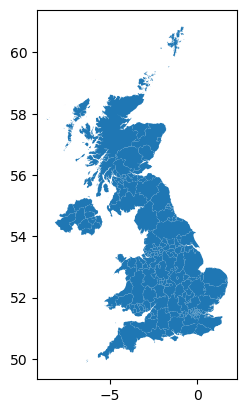

In [11]:
if not isinstance(customers_join_pc, gpd.GeoDataFrame):
        raise TypeError("insure gdf_within is a geopandas df")

if not isinstance(uk_region_shapes, gpd.GeoDataFrame):
    raise TypeError("insure gdf_region_shapes is a geopandas df")

uk_region_shapes.plot()

### Spatial Joins of Customer & Regional Data

In [12]:
customers_region_spatial_join = gpd.sjoin(
    customers_join_pc, uk_region_shapes, how="right", predicate="within"
)
#customers_region_spatial_join = customers_region_spatial_join.set_geometry("GEOMETRY")
print(customers_region_spatial_join.shape)
customers_region_spatial_join.head()


(496284, 13)


,index_left,MEMBER_ID,POSTCODE,BALANCE,POSTCODE_STRIP,LATITUDE,LONGITUDE,POSTCODE_AREA,POSTCODE_AREA_NAME,REGION,REGION_NAME,GEOMETRY,GEOMETRY_JSON
0,345,1345,AB22 8GG,37826.96,AB228GG,57.194327,-2.132180,AB,Aberdeen,Scotland,Aberdeen City,"POLYGON ((-2.06138 57.21195, -2.06363 57.20618...","{'type': 'Polygon', 'coordinates': (((-2.06137..."
0,641,1641,AB21 7DG,82129.45,AB217DG,57.209424,-2.180511,AB,Aberdeen,Scotland,Aberdeen City,"POLYGON ((-2.06138 57.21195, -2.06363 57.20618...","{'type': 'Polygon', 'coordinates': (((-2.06137..."
0,716,1716,AB24 1FR,37793.63,AB241FR,57.164820,-2.089251,AB,Aberdeen,Scotland,Aberdeen City,"POLYGON ((-2.06138 57.21195, -2.06363 57.20618...","{'type': 'Polygon', 'coordinates': (((-2.06137..."
0,848,1848,AB16 9WD,33413.78,AB169WD,57.153446,-2.147753,AB,Aberdeen,Scotland,Aberdeen City,"POLYGON ((-2.06138 57.21195, -2.06363 57.20618...","{'type': 'Polygon', 'coordinates': (((-2.06137..."
0,1081,2081,AB24 3PT,17759.83,AB243PT,57.163999,-2.115471,AB,Aberdeen,Scotland,Aberdeen City,"POLYGON ((-2.06138 57.21195, -2.06363 57.20618...","{'type': 'Polygon', 'coordinates': (((-2.06137..."


### Aggregate Data to Region-level

In [13]:
### need to revisit this!!!! check regions
# can get region from postcode OR using cenroid as we now have REGION shapes - this is for any filtering to reduce time producing map
# customers_region_spatial_join[(customers_region_spatial_join['REGION_NAME'] == 'Oxfordshire') & (customers_region_spatial_join['REGION'] != 'South East')]

In [15]:
customers_region_spatial_join_agg = customers_region_spatial_join.groupby(['REGION_NAME', 'GEOMETRY']).agg(
    BALANCE_SUM=('BALANCE', 'sum'),
    BALANCE_AVG=('BALANCE', 'mean'),
    MEMBER_COUNT=('MEMBER_ID', 'count')  
).reset_index()
print(customers_region_spatial_join_agg.shape)
#customers_region_spatial_join_agg_regions = pd.merge(customers_region_spatial_join_agg, relevent_regions, on='REGION_NAME', how='left')
customers_region_spatial_join_agg_regions_gdf = gpd.GeoDataFrame(customers_region_spatial_join_agg, geometry="GEOMETRY", crs="EPSG:4326")
customers_region_spatial_join_agg_regions_gdf.head()

(217, 5)


,REGION_NAME,GEOMETRY,BALANCE_SUM,BALANCE_AVG,MEMBER_COUNT
0,Aberdeen City,"POLYGON ((-2.06138 57.21195, -2.06363 57.20618...",8.998245e+07,49962.495086,1801
1,Aberdeenshire,"POLYGON ((-2.06138 57.21195, -2.06385 57.21428...",1.369404e+08,49688.102039,2756
2,Angus,"POLYGON ((-2.44494 56.75171, -2.44446 56.7511,...",5.435973e+07,49283.530417,1103
3,Antrim and Newtownabbey,"POLYGON ((-5.86929 54.68893, -5.8737 54.68557,...",4.544849e+07,50894.162128,893
4,Ards and North Down,"MULTIPOLYGON (((-5.53486 54.68176, -5.5324 54....",5.374786e+07,49309.959798,1090


In [16]:
assert isinstance(customers_region_spatial_join_agg_regions_gdf, gpd.GeoDataFrame)

## Produce Colour Map Visualisations

In [ ]:
from abc import ABC, abstractmethod

import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.wkt import loads
import yaml
import plotly.express as px
import plotly.graph_objects as go

def create_px_heat_map_layer(
    gdf_colour: pd.DataFrame,
    region_level: str,
    colour_metric: str,
    colour_scale: str = "Plasma",
    log: bool = False,
    scale_tick_no: int = 6,
    geojson_dict: dict = None,
    numerical_columns: list = [],
) -> go.Figure:
    """
    Create a heat map layer using Plotly.

    Args:
        gdf_colour (pd.DataFrame): The dataframe containing data for coloring the map.
        region_level (str): The level of regions in the map.
        colour_metric (str): The metric to color the map by.
        colour_scale (str): The color scale to use for the map. Default is "Plasma".
        log (bool): Whether to apply logarithmic scaling to the colour metric. Default is False.
        scale_tick_no (int): Number of ticks to use for the color scale. Default is 6.
        geojson_dict (dict): The GeoJSON dictionary for the map.

    Returns:
        go.Figure: The Plotly figure representing the heat map layer.
    """

    gdf_colour[numerical_columns] = gdf_colour[numerical_columns].apply(
        pd.to_numeric, errors="coerce"
    )

    if log:
        gdf_colour[colour_metric] = gdf_colour[colour_metric].replace(
            0, np.nan
        )  # Avoid log(0)
        gdf_colour[f"log_{colour_metric}"] = np.log10(gdf_colour[colour_metric])
        color_metric_log = f"log_{colour_metric}"
    else:
        color_metric_log = colour_metric

    # Generate representative ticks for the color bar
    min_value = gdf_colour[colour_metric].min()
    max_value = gdf_colour[colour_metric].max()
    representative_ticks = np.linspace(min_value, max_value, scale_tick_no)

    tickvals = np.log10(representative_ticks) if log else representative_ticks
    ticktext = [int(vlu) for vlu in representative_ticks]
    ticktext = [sigfig_round(number, sigfigs=2) for number in ticktext]

    colourmap_trace = px.choropleth_mapbox(
        gdf_colour.round(2),
        geojson=construct_geojson_dict(df=gdf_colour, metric=colour_metric),
        locations="REGION_NAME",
        color=color_metric_log,
        mapbox_style="open-street-map",
        featureidkey="properties.region",
        color_continuous_scale=colour_scale,
        opacity=0.5,
        center=dict(lat=55, lon=-2.6),
        labels={"location": "LOCATION_NAME"},
        zoom=3,
        hover_data=gdf_colour.drop(columns=["GEOMETRY"]).columns,
    )

    colourmap_trace.update_layout(
        coloraxis_colorbar=dict(
            title=colour_metric.replace("_", " ").title(),
            tickvals=tickvals,
            ticktext=ticktext,
            x=-0.1,
        )
    )

    return colourmap_trace

In [ ]:
def sigfig_round(number: float, sigfigs: int):
    """
    Round the number to the specified significant figures.

    Args:
        number (float): The number to be rounded.
        sigfigs (int): The number of significant figures to round to.

    Returns:
        float: The rounded number.
    """
    if number == 0:
        return 0
    else:
        return round(number, -int(np.floor(np.log10(abs(number))) - (sigfigs - 1)))

In [ ]:
from shapely.geometry import mapping

def construct_geojson_dict(
    df: pd.DataFrame,
    region_name: str = "REGION_NAME",
    metric: str = "IAGL_MEMBER_ID_BAEC_COUNT",
) -> dict:
    """
    Construct a GeoJSON dictionary from a DataFrame.

    Args:
        df (pd.DataFrame): The dataframe containing the data to be converted to GeoJSON.
        region_name (str): The column name for region names. Default is "REGION_NAME".
        metric (str): The column name for the metric to include in the GeoJSON properties. Default is "IAGL_MEMBER_ID_BAEC_COUNT".

    Returns:
        dict: A dictionary in GeoJSON format representing the features in the dataframe.
    """

    features = []
    for index, row in df.iterrows():
        # Convert the shapely.geometry.Polygon object to GeoJSON-compatible dictionary
        geometry = mapping(row["GEOMETRY"])

        # Construct a GeoJSON feature
        feature = {
            "type": "Feature",
            "geometry": geometry,
            "properties": {
                "region": row[region_name],
                metric: row[metric],
                # other properties as needed
            },
        }
        features.append(feature)

    geojson = {"type": "FeatureCollection", "features": features}

    return geojson


### Interactive

In [27]:
fig = create_px_heat_map_layer(customers_region_spatial_join_agg_regions_gdf, 'REGION_NAME', 'BALANCE_SUM').update_layout(
    margin=dict(l=10, r=10, t=10, b=10)  # Removes extra white space around the map
)
fig

### Static

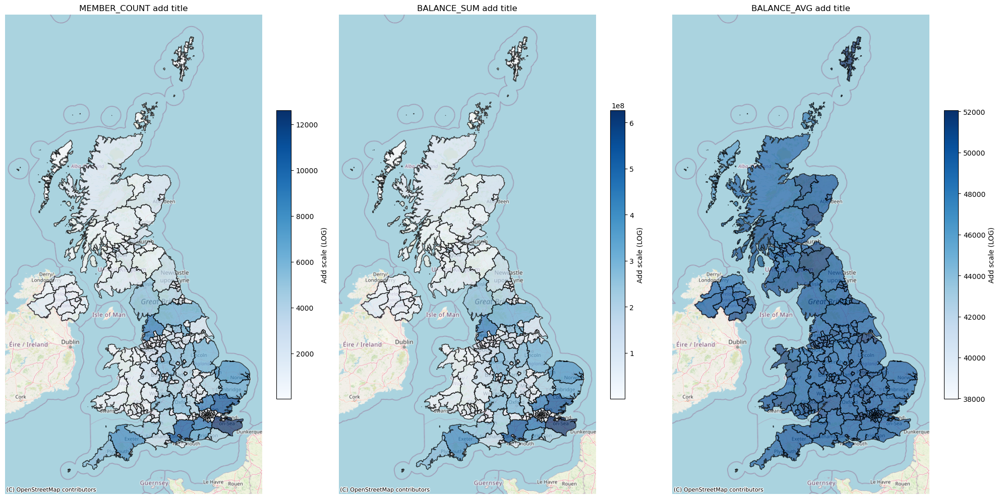

In [122]:
import matplotlib.pyplot as plt
import contextily as ctx

gdf = customers_region_spatial_join_agg_regions_gdf
gdf = gdf.to_crs(epsg=3857)

colour_metrics = ['MEMBER_COUNT', 'BALANCE_SUM', 'BALANCE_AVG']  # Ensure at least 2 metrics

fig, axs = plt.subplots(1, len(colour_metrics), figsize=(20, 10))
axs = axs.flatten()

for idx, metric in enumerate(colour_metrics):  
    ax = axs[idx]
    
    gdf.plot(column=metric, cmap='Blues', ax=ax, alpha=0.7, edgecolor="black") 

    sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=gdf[metric].min(), vmax=gdf[metric].max()))  # option to log the axis
    #sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, fraction=0.05, pad=0.05)
    cbar.set_label('Add scale (LOG)') 
    
    # Add background map - this is optional
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)  

    ax.set_title(f'{metric} add title')  
    ax.axis('off')

plt.tight_layout()
#plt.subplots_adjust(wspace=0.1) # play around with the formatting here until happy. You can also edit the formatting of the colour bar .
plt.show()
#plt.savefig('tickets_district_log.png') # option to save the figure when happy with the output

In [35]:
fig.write_html('outputs/map.html')